# Dimensionality Reduction Techniques

## Abstract 

When dealing with huge volumes of data, a problem naturally arises. How do you whittle down a dataset of hundreds or even thousands of variables into an optimal model? How do you visualize data through countless dimensions?  Fortunately, a series of techniques called dimensionality reduction aim to help alleviate these issues. It estimates how informative each variable is and, if needed, to skim it off the dataset. 

There is no best technique for dimensionality reduction. Instead, the best approach is to use systematic controlled experiments to discover what dimensionality reduction techniques, when paired with your model of choice, result in the best performance on your dataset.


## Introduction

i. In machine learning, we refer number of features or input variables as the dimensionality.

ii. A large amount of training data helps the machine learning model to learn more rules and better generalize to new unseen data. 

iii. But an indiscriminate addition of low-quality data and input features might introduce too much noise and, at the same time, considerably slow down the training algorithm.

iv. The difficulties related to training machine learning models due to high dimensional data is referred to as Curse of Dimensionality.

v. So, in the presence of high dimensional dataset, it is good practice to find how many of these data features are actually really informative for the model.

vi. Dimensionality reduction is the process of transformation of data from high dimensional space to low dimensional space.


## Techniques of Dimensionality Reduction

Two main methodologies for reducing dimensions: feature selection and feature extraction.

i. Feature Selection:
filtering irrelevant or redundant features from the dataset without incurring too much loss of information. 

ii. Feature extraction:
transform the data from high to lower dimensions by selecting and/ or combining the existing variables into a new set of features that captures most of the useful information.

## Usecases

Most Dimensionality Reduction applications are used for:

Data Compression

Noise Reduction

Data Visualization

Data Classification



## Agenda

The aim is to provide the intuition behind the dimensionality reduction techniques. We will mainly focus on the three most popular techniques — PCA, t -SNE, LDA. We are going to discuss their advantages, when to use and their implementation. And also we will implement all three algorithms on Sign-Language-MNIST Dataset.


# PCA (Principal Component Analysis)



i. Unsupervised machine learning method 

ii. Works best on linear data

iii. Aim is to find the hyperplane which lies closest to the data and then projects the data on that hyperplane while retaining most of the variation in the data set.

iv. Transforms the variables into a new set of variables which is a combination of  features from original dataset in such a way that maximum variation is retained.

v. This combination of variable is known as Principal Components (PCs) and the component which has the maximum variance captured is called the 1st Principal Component (PC1).

vi. The order of retention of variance decreases as we move down in the order, i.e. PC1 > PC2 > PC3 >… so on

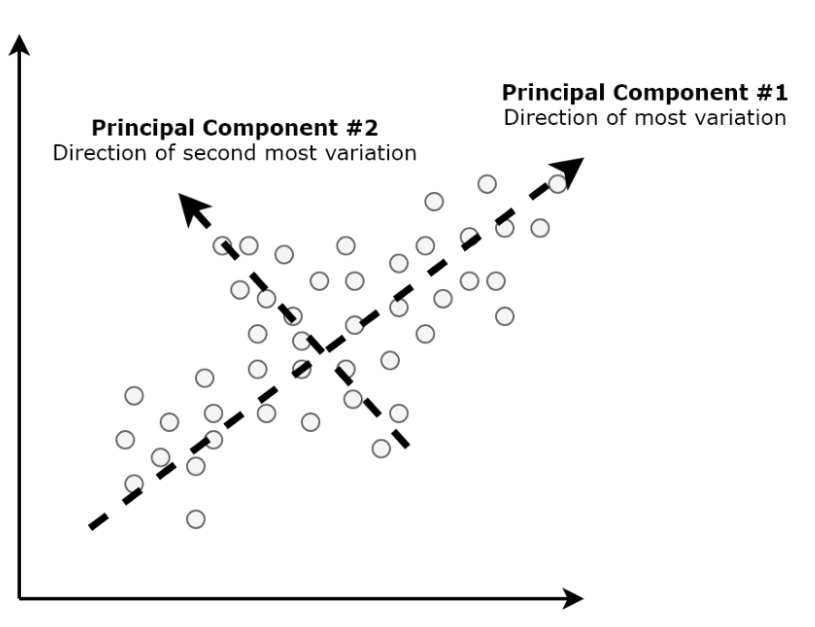


## PCA Methodology

Step 1: Standardize each column

If there are values of a different order of magnitude, then scale/standardize them. Convert the categorical variable into dummy numerical variables because PCA works only on numerical data.

Step 2: Compute Covariance Matrix

Start with the analysis of the covariance matrix of the features.

Step 3: Compute Eigenvalues and Eigenvectors

The eigenvectors and eigenvalues of a matrix A are defined to be non-zero X and ⲗ values that solve,

AX = ⲗX

Element of eigenvector (X) are Principal component directions and eigenvalues (ⲗ) are magnitude of variance along those directions.


Step 4: Derive principal component features

By taking the dot product of eigenvector and standardized columns, derive the principal component features.

## Implementation 

Visualize a high dimensional dataset using PCA.

The Sign-Language-MNIST Dataset:https://www.kaggle.com/datamunge/sign-language-mnist

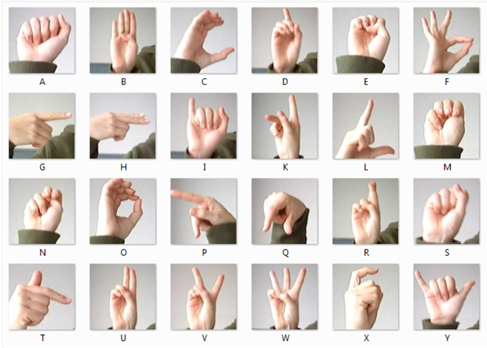


In [1]:
import numpy as np
import pandas as pd
import time

# For plotting
import plotly.io as plt_io
import plotly.graph_objects as go
%matplotlib inline

#PCA
from sklearn.decomposition import PCA

# load the data
train = pd.read_csv('sign_mnist_train.csv')
train.head()

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,3,107,118,127,134,139,143,146,150,153,...,207,207,207,207,206,206,206,204,203,202
1,6,155,157,156,156,156,157,156,158,158,...,69,149,128,87,94,163,175,103,135,149
2,2,187,188,188,187,187,186,187,188,187,...,202,201,200,199,198,199,198,195,194,195
3,2,211,211,212,212,211,210,211,210,210,...,235,234,233,231,230,226,225,222,229,163
4,13,164,167,170,172,176,179,180,184,185,...,92,105,105,108,133,163,157,163,164,179


In [2]:
train.shape

(27455, 785)

In [3]:
## Setting the label and the feature columns
y = train.loc[:,'label'].values
x = train.loc[:,'pixel1':].values

In [4]:
#number of unique levels
print(np.unique(y))

[ 0  1  2  3  4  5  6  7  8 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24]


In [5]:
#picking only the first 10 labels
train = train[train['label'] < 10]
# Setting the label and the feature columns
y = train.loc[:,'label'].values
x = train.loc[:,'pixel1':].values

In [6]:
# Standardizing the data
from sklearn.preprocessing import StandardScaler
## Standardizing the data
x = StandardScaler().fit_transform(x)

In [7]:
# Implementing PCA
start = time.time()
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(x)
print('Duration: {} seconds'.format(time.time() - start))
principal = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2','principal component 3'])


Duration: 0.3280057907104492 seconds


In [8]:
# plotting the components in 2D & 3D

def plot_2d(component1, component2):
    
    fig = go.Figure(data=go.Scatter(
        x = component1,
        y = component2,
        mode='markers',
        marker=dict(
            size=20,
            color=y, #set color equal to a variable
            colorscale='Rainbow', # one of plotly colorscales
            showscale=True,
            line_width=1
        )
    ))
    fig.update_layout(margin=dict( l=100,r=100,b=100,t=100),width=2000,height=1200)                 
    fig.layout.template = 'plotly_dark'
    
    fig.show()
    
def plot_3d(component1,component2,component3):
    fig = go.Figure(data=[go.Scatter3d(
            x=component1,
            y=component2,
            z=component3,
            mode='markers',
            marker=dict(
                size=10,
                color=y,                # set color to an array/list of desired values
                colorscale='Rainbow',   # choose a colorscale
                opacity=1,
                line_width=1
            )
        )])
# tight layout
    fig.update_layout(margin=dict(l=50,r=50,b=50,t=50),width=1800,height=1000)
    fig.layout.template = 'plotly_dark'
    
    fig.show()

In [9]:
plot_2d(principalComponents[:, 0],principalComponents[:, 1])

In [10]:
plot_3d(principalComponents[:, 0],principalComponents[:, 1], principalComponents[:, 2])

# LDA ( Linear Discriminant Analysis )

i. Supervised machine learning method that is used to separate two groups/classes.

ii. Focuses on maximizing the separability among known categories by creating a new linear axis and projecting the data points on that axis.

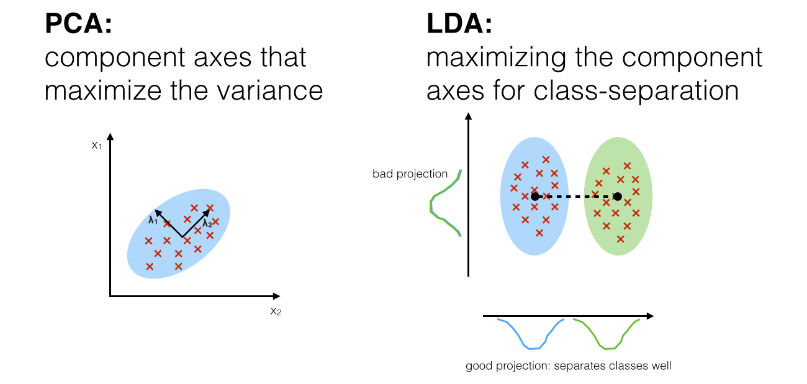

iii. Objective is to find a line that maximizes the class separation and the minimized the separation of samples within each class.


## LDA Methodology

Step 1:

Calculate the separability between different classes(i.e the distance between the mean of different classes) also called as between-class variance.

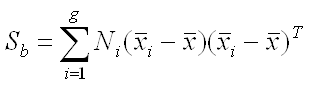

Step 2:

Calculate the distance between the mean and sample of each class, which is called the within class variance.

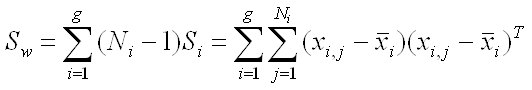

Step 3:

Construct the lower-dimensional space that maximizes between-class variance and minimizes within-class variance. In the equation below P is the lower-dimensional space projection. This is also known as Fisher’s criterion.

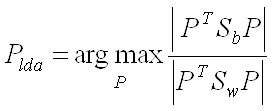



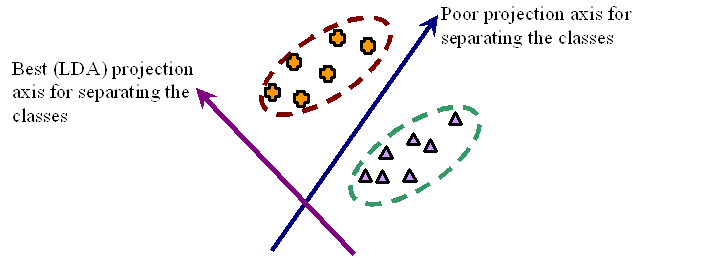

## Implementation

In [13]:
## LDA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA


start = time.time()
X_LDA = LDA(n_components=3).fit_transform(x,y)
print('Duration: {} seconds'.format(time.time() - start))

Duration: 2.9726645946502686 seconds


In [14]:
## Plot the components on 2D & 3D

plot_2d(X_LDA[:, 0],X_LDA[:, 1])

In [15]:
plot_3d(X_LDA[:, 0],X_LDA[:, 1],X_LDA[:, 2])

# t-SNE ( T-distributed stochastic neighbour embedding )

i. Unsupervised machine learning method

ii. Unlike PCA and LDA, T-SNE is a non-linear data visualizer



## t-sne Procedure

Step 1: Probability Distribution

Stochastic Neighbor Embedding (SNE) starts by converting the high-dimensional Euclidean distances between data points into conditional probabilities that represent similarities.
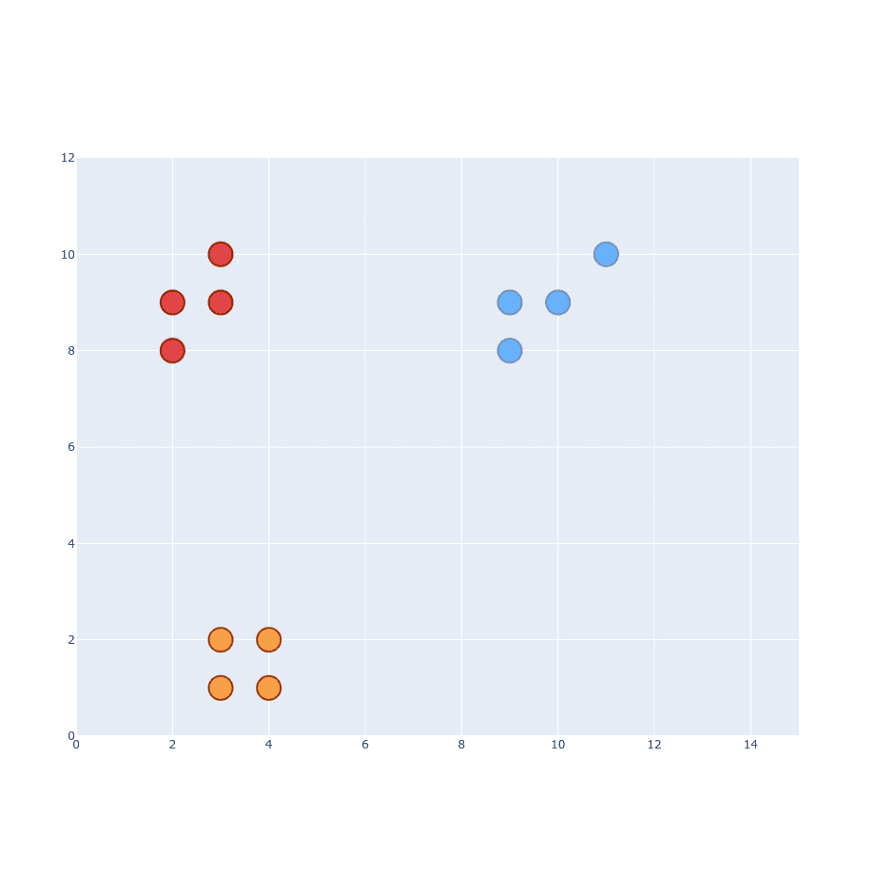
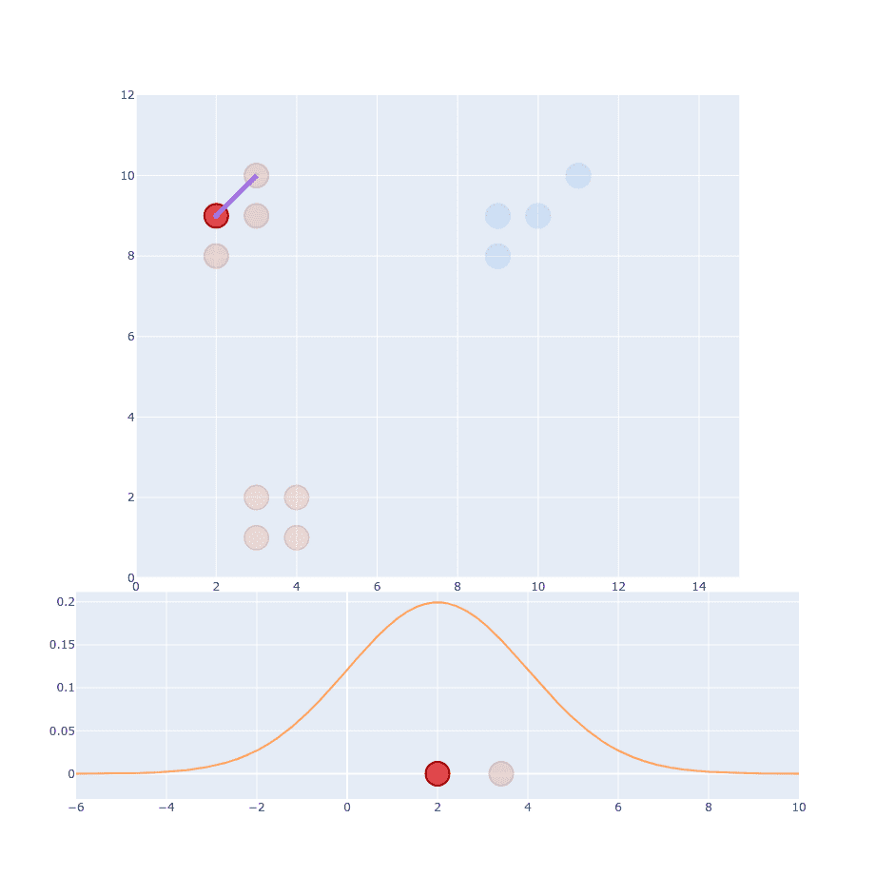
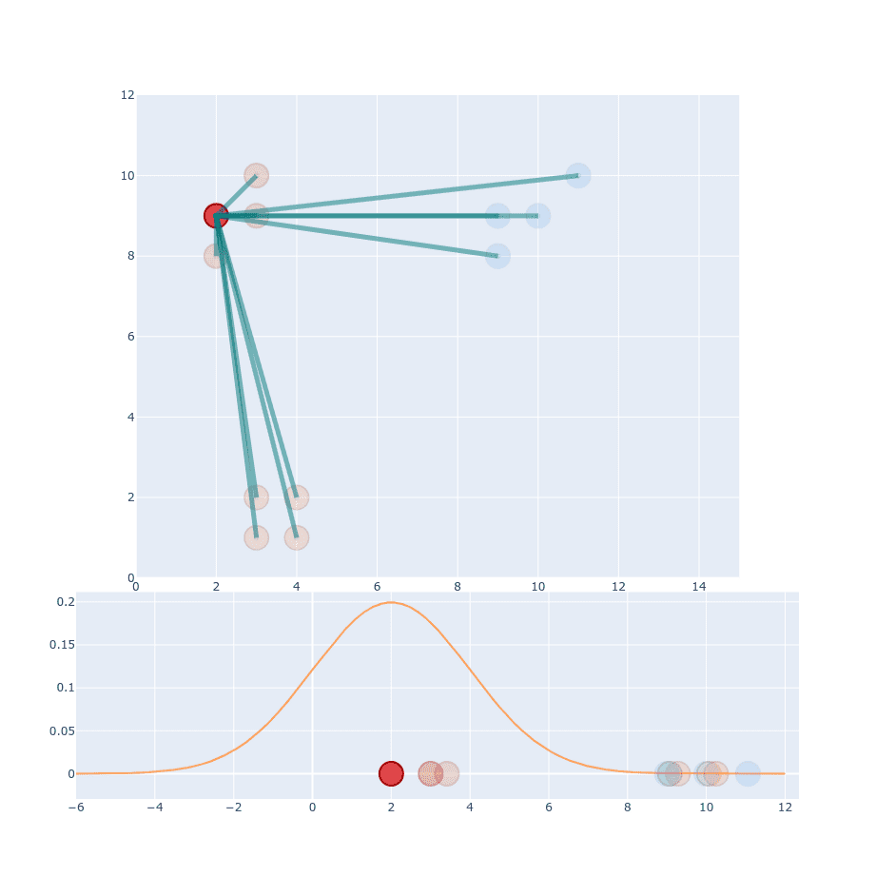


Step 2: Create low-dimensional space

The goal is to find similar probability distribution in low-dimensional space. 

The most obvious choice for new distribution would be to use Gaussian again. 

One of the properties of Gaussian is that it has a “short tail” and because of that it creates a crowding problem. 
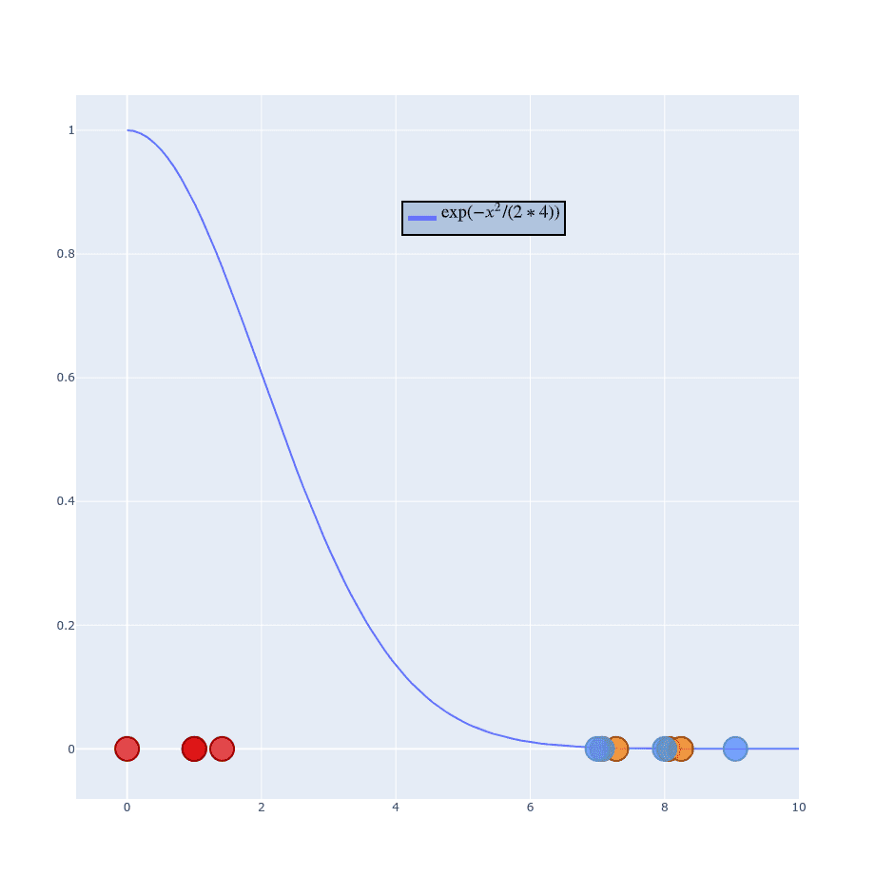

To solve that we’re going to use Student t-distribution with a single degree of freedom. It has a “long tail” so points won’t get squashed into a single point.
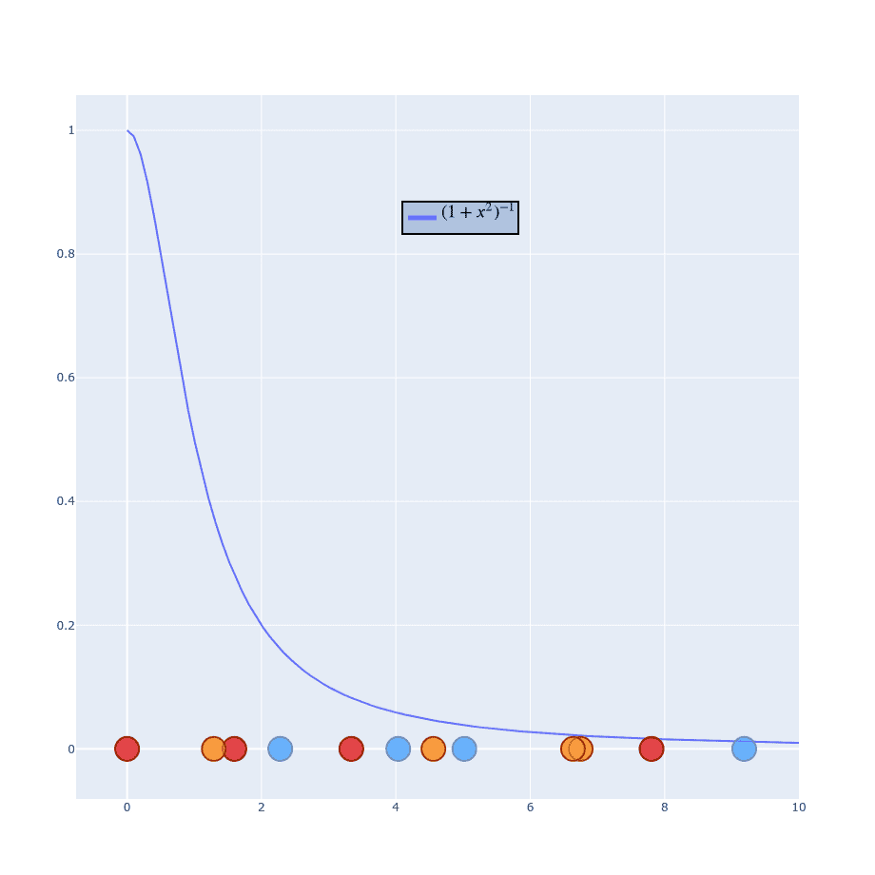

Step 3:

It then tries to minimize the difference between these conditional probabilities (or similarities) in higher-dimensional and lower-dimensional space for a perfect representation of data points in lower-dimensional space.


To measure the minimization of the sum of the difference of conditional probability t-SNE minimizes the sum of KL divergence of overall data points using a gradient descent method.



## Implementation

It is highly recommended to use another dimensionality reduction method  to reduce the number of dimensions to a reasonable amount (e.g. 50) if the number of features is very high. This will suppress some noise and speed up the computation of pairwise distances between samples.

In [16]:
#TSNE
from sklearn.manifold import TSNE


start = time.time()
pca_50 = PCA(n_components=50)
pca_result_50 = pca_50.fit_transform(x)
tsne = TSNE(random_state = 42, n_components=3,verbose=0, perplexity=40, n_iter=400).fit_transform(pca_result_50)
print('Duration: {} seconds'.format(time.time() - start))

Duration: 125.2544116973877 seconds


In [17]:
plot_2d(tsne[:, 0],tsne[:, 1])

In [18]:
plot_3d(tsne[:, 0],tsne[:, 1],tsne[:, 2])

# Comparison

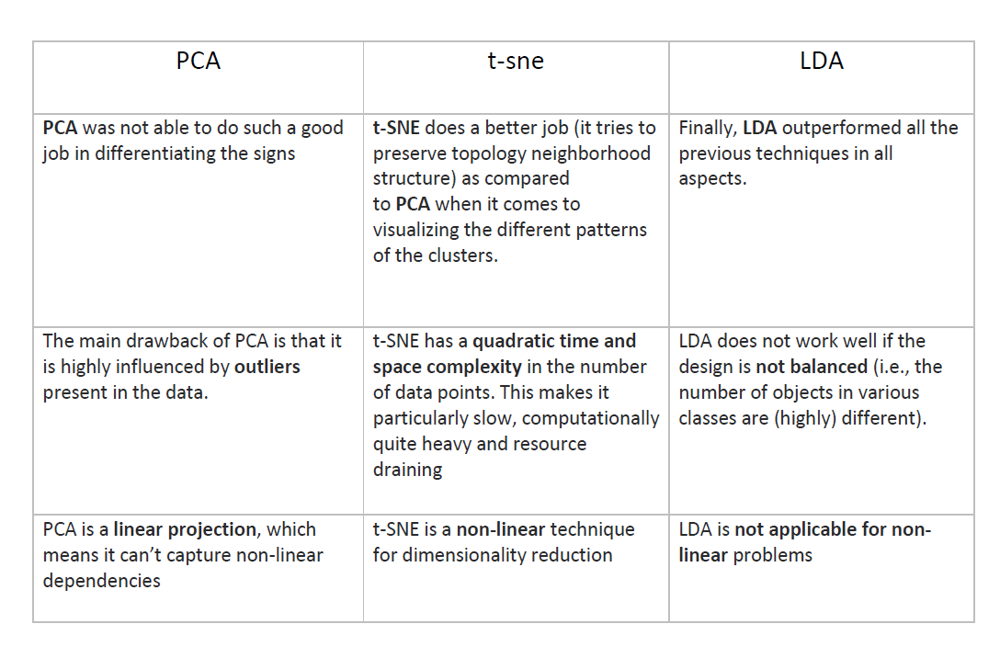

# Summary

i. We have explored three dimensionality reduction techniques for data visualization : (PCA, t-SNE, LDA) and tried to use them to visualize a high-dimensional dataset in 2d and 3d plots.

ii. There is no best technique for dimensionality reduction and no mapping of techniques to problems

iii. Deciding which technique to use comes down to trial-and-error and preference. It’s common to start with a linear technique and move to non-linear techniques when results suggest inadequate fit. 

iv. Also different methods will perform better based on how many dimensions you are trying to reduce by.

v. In order to make a well-informed decision, you may need to experiment and iterate with these different techniques until you find one that works best for your goals and objectives.

# References

https://medium.com/@srishtisawla/linear-discriminant-analysis-d38decf48105

https://www.datacamp.com/community/tutorials/introduction-t-sne

https://blog.treasuredata.com/blog/2016/03/25/dimensionality-reduction-techniques-where-to-begin/?dismissed=yes

https://medium.com/analytics-vidhya/pca-vs-lda-vs-t-sne-lets-understand-the-difference-between-them-22fa6b9be9d0

https://medium.com/analytics-vidhya/dimensionality-reduction-pca-vs-lda-vs-t-sne-681636bc686

https://towardsdatascience.com/dimensionality-reduction-for-data-visualization-pca-vs-tsne-vs-umap-be4aa7b1cb29

https://www.kaggle.com/datamunge/sign-language-mnist